# 4. Technical Validation of the PulseOx dataset

# defines and imports

In [80]:
# replace protean-chassis-368116 with your own project id
%env GOOGLE_CLOUD_PROJECT = protean-chassis-368116

env: GOOGLE_CLOUD_PROJECT=protean-chassis-368116


In [81]:
import matplotlib.pyplot as plt
import pandas as pd
from google.colab import files
from google.cloud import bigquery

import missingno as msno
import matplotlib.pyplot as plt

import numpy as np
import seaborn as sns
from scipy import stats

from google.colab import auth
auth.authenticate_user()
print('Authenticated')

%load_ext google.colab.data_table

Authenticated
The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table


In [82]:
%config InlineBackend.figure_format = 'retina'

import warnings
warnings.filterwarnings('ignore')

## load data

In [83]:
%%bigquery df

SELECT *
FROM `protean-chassis-368116.pulseox_physionet.merged_all_pairs`

Query is running:   0%|          |

Downloading:   0%|          |

In [84]:
df.head()

,subject_id,hospital_admission_id,icustay_id,pH,pCO2,pO2,SaO2,SpO2,Carboxyhemoglobin,Methemoglobin,delta_SpO2,source_db,race_ethnicity,sex_female
0,15306992,22976369,38096854,7.39,47.0,238.0,99.0,100.0,NaN,NaN,-3.0,mimic_iv,Asian,0
1,15306992,22976369,38096854,7.36,46.0,110.0,96.0,100.0,NaN,NaN,-25.0,mimic_iv,Asian,0
2,15306992,22976369,38096854,7.40,44.0,135.0,97.0,100.0,NaN,NaN,-25.0,mimic_iv,Asian,0
3,15306992,22976369,38096854,7.43,41.0,76.0,94.0,96.0,NaN,NaN,-8.0,mimic_iv,Asian,0
4,14370607,24591817,30744669,7.37,30.0,182.0,100.0,100.0,NaN,NaN,-14.0,mimic_iv,Asian,0


## ohdc curve

In [85]:
SaO2_min = 0
SaO2_max = 100

pO2_min = 0
pO2_max = 200

df = df[(df['SaO2'] >= SaO2_min) & (df['SaO2'] <= SaO2_max)]
df = df[(df['pO2'] >= pO2_min) & (df['pO2'] <= pO2_max)]


### no stratification

In [86]:
def plot_oxyhemoglobin_curve(df):
    # Parameters for the oxyhemoglobin dissociation curve
    p50 = 26.6
    n = 2.7

    # Create a range of pO2 values
    pO2_values = np.linspace(0, 200, 500)

    # The sigmoid function representing the oxyhemoglobin dissociation curve
    SaO2_values = 100 * (pO2_values ** n) / (p50 ** n + pO2_values ** n)

    # Create the plot
    plt.figure(figsize=(10, 8))
    plt.scatter(df['pO2'], df['SaO2'], marker='o', color='tab:blue', alpha=0.3, label='Data Points')
    plt.plot(pO2_values, SaO2_values, color='r', label='Theoretical Curve')
    plt.title('Oxyhemoglobin Dissociation Curve', fontsize=18)
    plt.xlabel('pO2 (mmHg)', fontsize=15)
    plt.ylabel('SaO2 (%)', fontsize=15)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend(fontsize=13)
    plt.show()


#### all

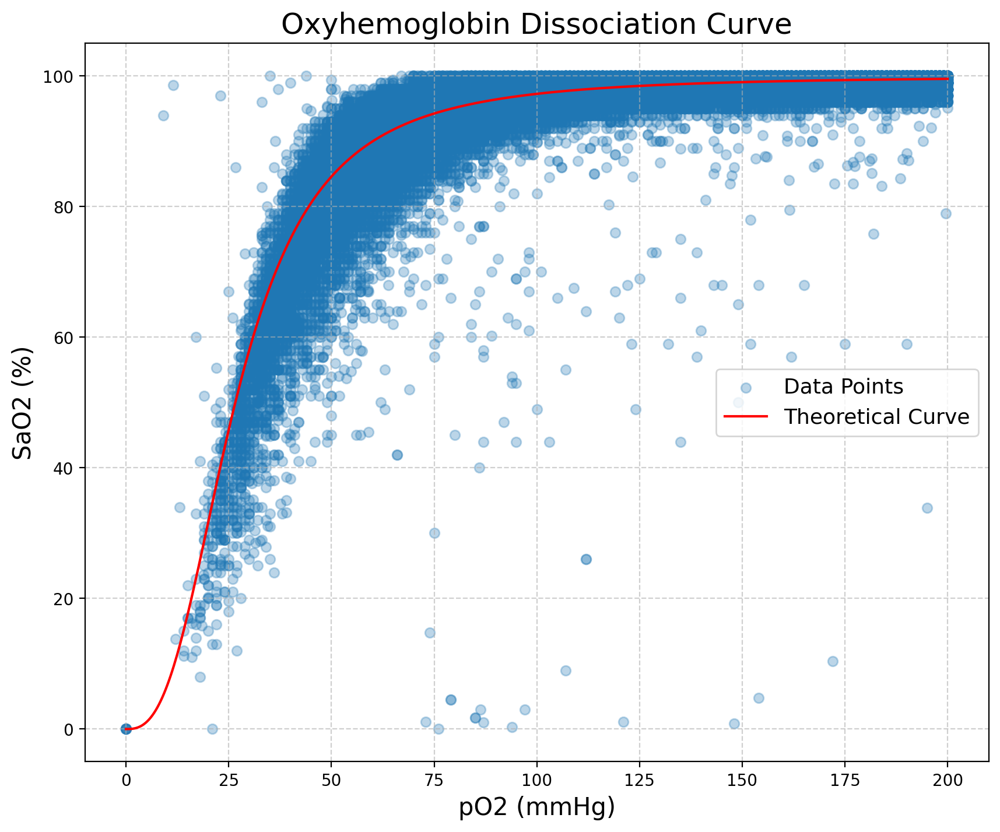

In [87]:
plot_oxyhemoglobin_curve(df)

#### all but 70-100 only

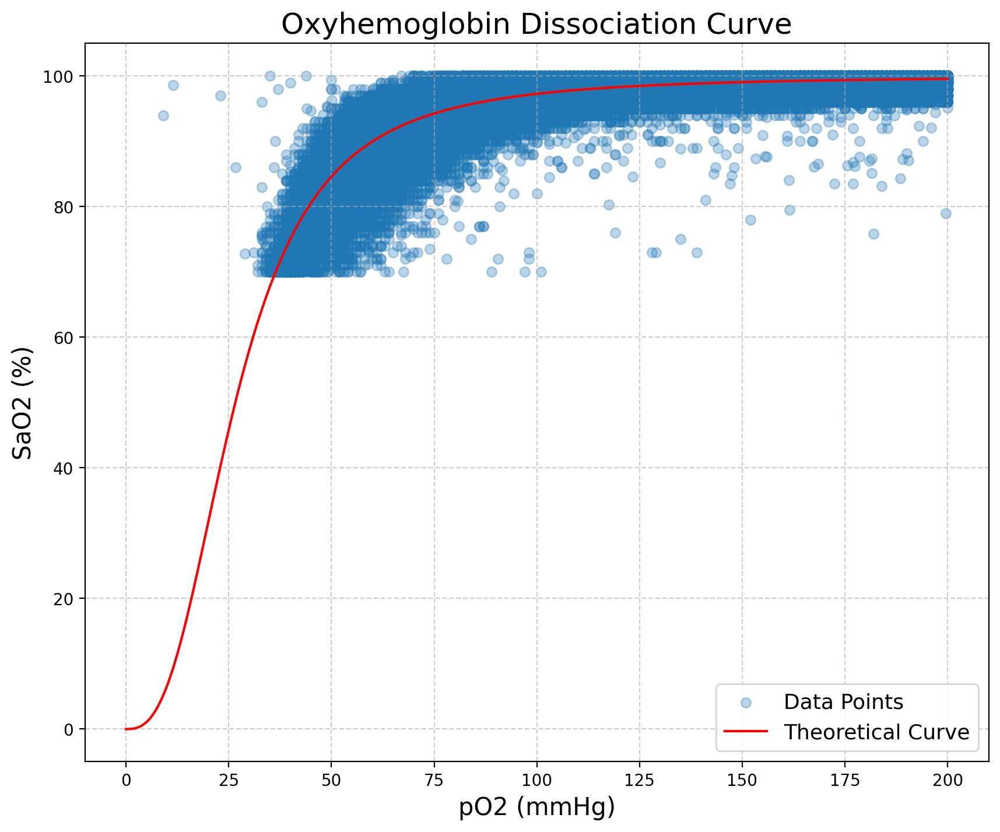

In [88]:
# 2. Plotting with a subset of df where SaO2 is between 70 and 100, and pO2 is within certain bounds
SaO2_min = 70
SaO2_max = 100
pO2_min = 0
pO2_max = 200

subset_df = df[(df['SaO2'] >= SaO2_min) & (df['SaO2'] <= SaO2_max) \
             & (df['pO2'] >= pO2_min) & (df['pO2'] <= pO2_max)]
plot_oxyhemoglobin_curve(subset_df)

#### with hemoglobin info

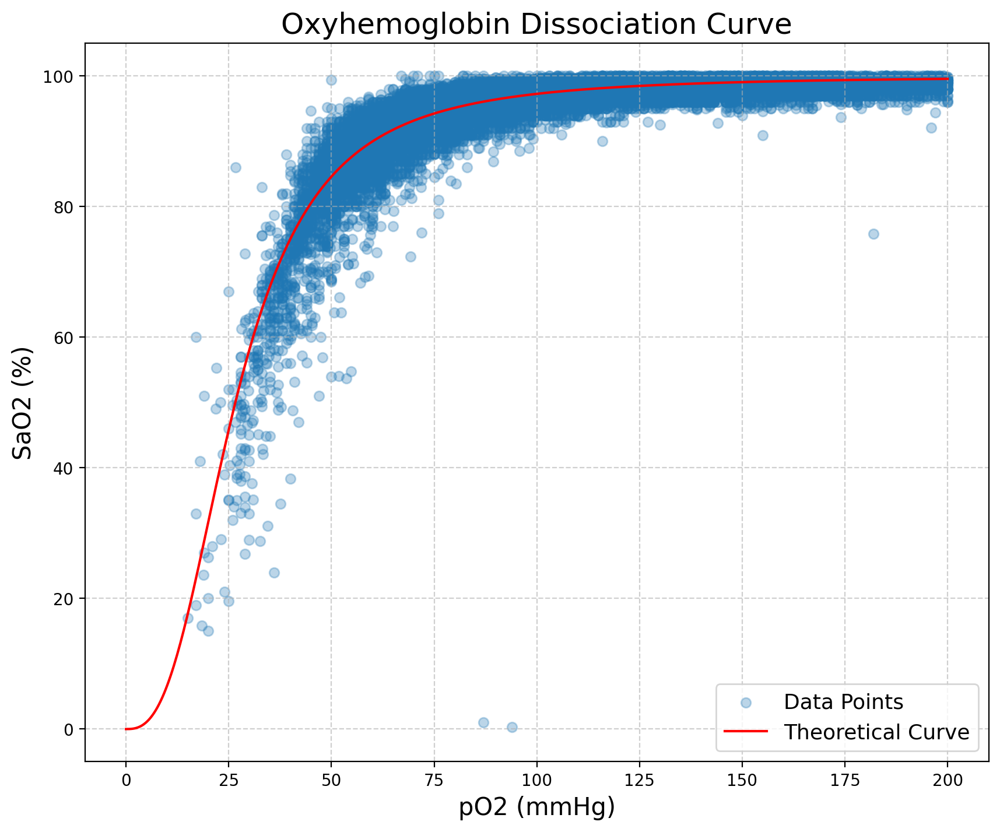

In [89]:
# 3. Plotting with a subset where Carboxyhemoglobin and Methemoglobin are not null
df_filtered = df[df['Carboxyhemoglobin'].notnull() & df['Methemoglobin'].notnull()]
plot_oxyhemoglobin_curve(df_filtered)

### by db

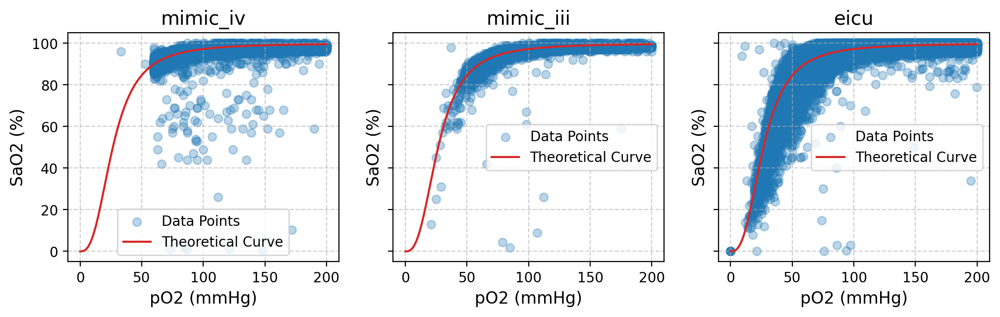

In [90]:
# Create the subplots
fig, axs = plt.subplots(1, 3, figsize=(12,3), sharex=True, sharey=True)

# List of databases
dbs = ['mimic_iv', 'mimic_iii', 'eicu']

# Loop through each database and create a plot
for ax, db in zip(axs, dbs):
    df_db = df[df['source_db'] == db]
    ax.scatter(df_db['pO2'], df_db['SaO2'], marker='o', color='tab:blue',
               alpha=0.3, label='Data Points')

    p50 = 26.6
    n = 2.7

    pO2_values = np.linspace(0, 200, 500)
    SaO2_values = 100 * (pO2_values ** n) / (p50 ** n + pO2_values ** n)

    ax.plot(pO2_values, SaO2_values, color='tab:red', label='Theoretical Curve')
    ax.set_title(f'{db}', fontsize=14)
    ax.set_xlabel('pO2 (mmHg)', fontsize=12)
    ax.set_ylabel('SaO2 (%)', fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(fontsize=10)

plt.show()


### by pH levels

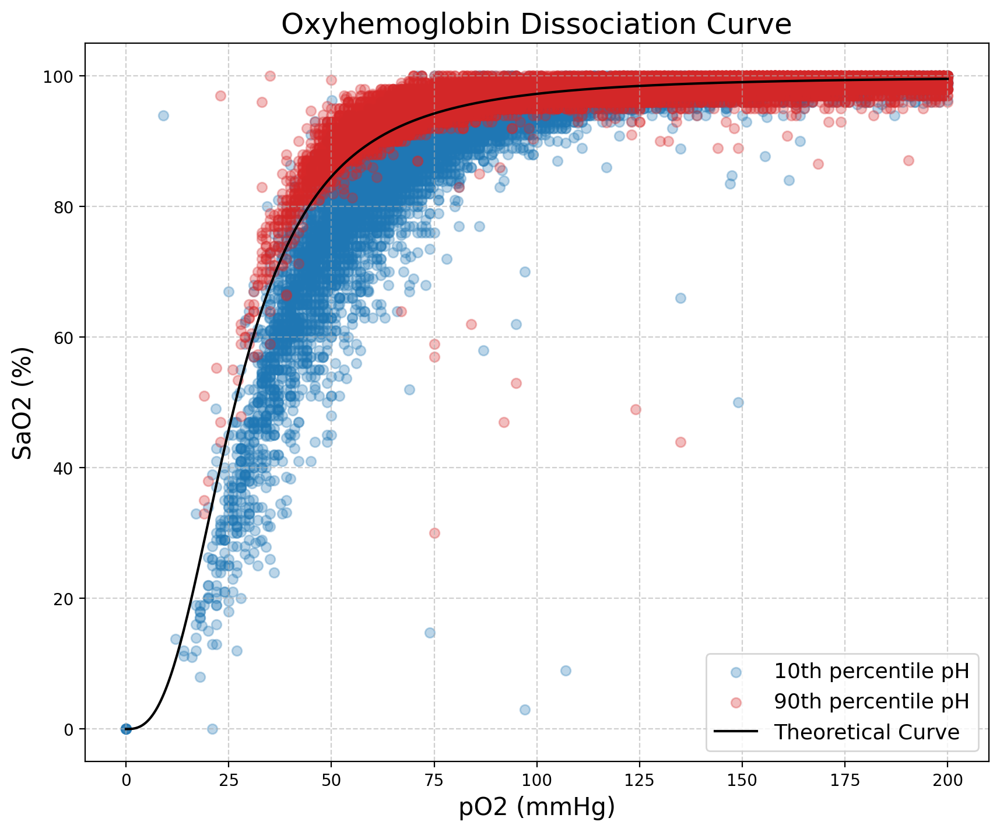

In [91]:

low_pH = df['pH'].quantile(0.1)
high_pH = df['pH'].quantile(0.9)

# Create subsets of the data for low and high pH
df_low_pH = df[df['pH'] <= low_pH]
df_high_pH = df[df['pH'] >= high_pH]

# Create the plot
plt.figure(figsize=(10, 8))
plt.scatter(df_low_pH['pO2'], df_low_pH['SaO2'], marker='o', color='tab:blue',
            alpha=0.3, label='10th percentile pH')

plt.scatter(df_high_pH['pO2'], df_high_pH['SaO2'], marker='o', color='tab:red',
            alpha=0.3, label='90th percentile pH')

plt.plot(pO2_values, SaO2_values, color='black', label='Theoretical Curve')
plt.title('Oxyhemoglobin Dissociation Curve', fontsize=18)
plt.xlabel('pO2 (mmHg)', fontsize=15)
plt.ylabel('SaO2 (%)', fontsize=15)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=13)
plt.show()


#### by pH and db

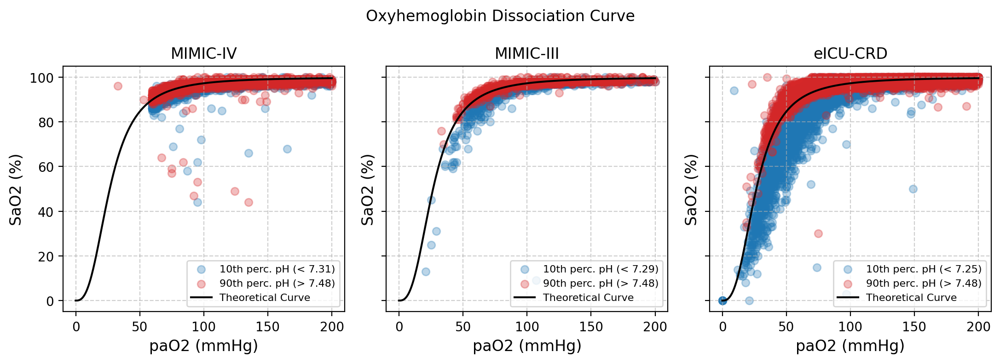

In [92]:
# Create the subplots
fig, axs = plt.subplots(1, 3, figsize=(11,4), sharex=True, sharey=True)

# List of databases
dbs = {'mimic_iv': "MIMIC-IV",
       'mimic_iii':"MIMIC-III",
       'eicu': "eICU-CRD"}

# Loop through each database and create a plot
for ax, (db, db_name) in zip(axs, dbs.items()):
    df_db = df[df['source_db'] == db]

    low_pH = df_db['pH'].quantile(0.1)
    high_pH = df_db['pH'].quantile(0.9)

    df_low_pH = df_db[df_db['pH'] <= low_pH]
    df_high_pH = df_db[df_db['pH'] >= high_pH]

    ax.scatter(df_low_pH['pO2'], df_low_pH['SaO2'], marker='o', color='tab:blue',
               alpha=0.3, label=f'10th perc. pH (< {low_pH:.2f})')
    ax.scatter(df_high_pH['pO2'], df_high_pH['SaO2'], marker='o', color='tab:red',
               alpha=0.3, label=f'90th perc. pH (> {high_pH:.2f})')

    ax.plot(pO2_values, SaO2_values, color='black', label='Theoretical Curve')

    ax.set_title(f'{db_name}', fontsize=12)
    ax.set_xlabel('paO2 (mmHg)', fontsize=12)
    ax.set_ylabel('SaO2 (%)', fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(fontsize=8, loc='lower right')

plt.suptitle("Oxyhemoglobin Dissociation Curve")
plt.tight_layout()
plt.show()


### by pCO2

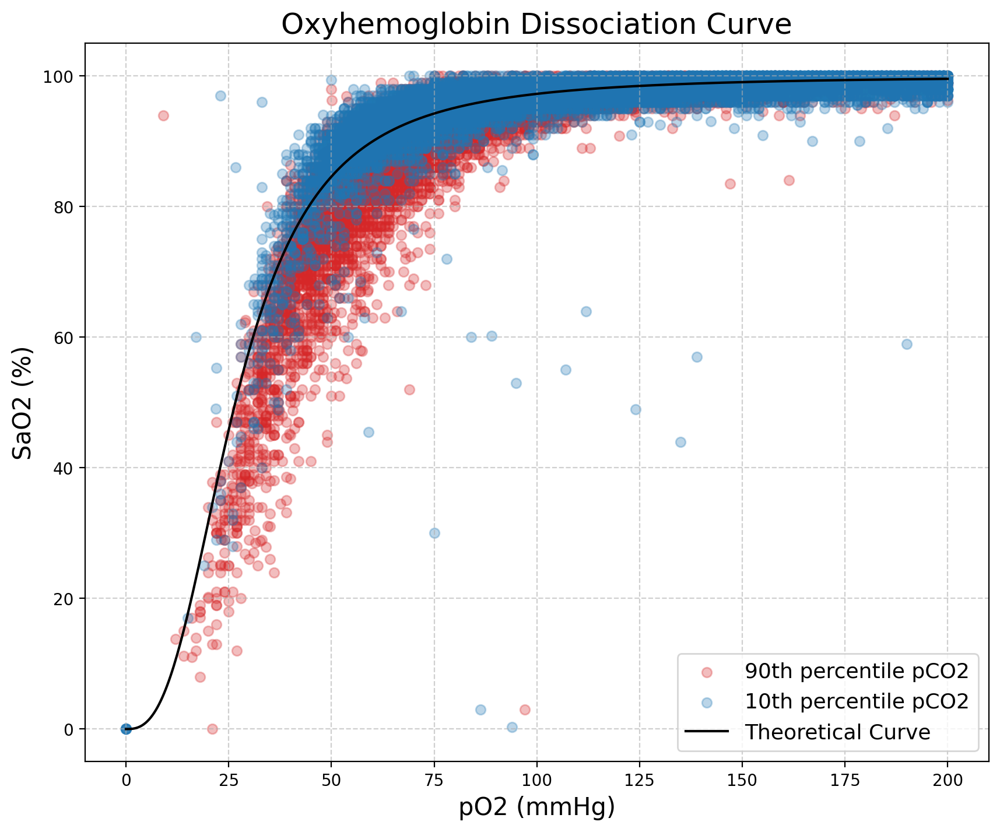

In [93]:

low_pCO2 = df['pCO2'].quantile(0.1)
high_pCO2 = df['pCO2'].quantile(0.9)

# Create subsets of the data for low and high pCO2
df_low_pCO2 = df[df['pCO2'] <= low_pCO2]
df_high_pCO2 = df[df['pCO2'] >= high_pCO2]

# Create the plot
plt.figure(figsize=(10, 8))

plt.scatter(df_high_pCO2['pO2'], df_high_pCO2['SaO2'], marker='o', color='tab:red',
            alpha=0.3, label='90th percentile pCO2')

plt.scatter(df_low_pCO2['pO2'], df_low_pCO2['SaO2'], marker='o', color='tab:blue',
            alpha=0.3, label='10th percentile pCO2')


plt.plot(pO2_values, SaO2_values, color='black', label='Theoretical Curve')
plt.title('Oxyhemoglobin Dissociation Curve', fontsize=18)
plt.xlabel('pO2 (mmHg)', fontsize=15)
plt.ylabel('SaO2 (%)', fontsize=15)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(fontsize=13)
plt.show()


#### by pCO2 and db

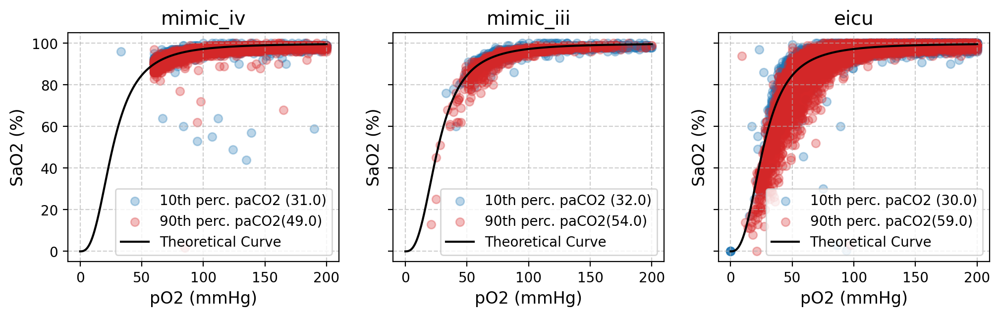

In [94]:
# Create the subplots
fig, axs = plt.subplots(1, 3, figsize=(12,3), sharex=True, sharey=True)

# List of databases
dbs = ['mimic_iv', 'mimic_iii', 'eicu']

# Loop through each database and create a plot
for ax, db in zip(axs, dbs):
    df_db = df[df['source_db'] == db]

    low_pH = df_db['pCO2'].quantile(0.1)
    high_pH = df_db['pCO2'].quantile(0.9)

    df_low_pH = df_db[df_db['pCO2'] <= low_pH]
    df_high_pH = df_db[df_db['pCO2'] >= high_pH]

    ax.scatter(df_low_pH['pO2'], df_low_pH['SaO2'], marker='o', color='tab:blue',
               alpha=0.3, label=f"10th perc. paCO2 ({low_pH})")
    ax.scatter(df_high_pH['pO2'], df_high_pH['SaO2'], marker='o', color='tab:red',
               alpha=0.3, label=f"90th perc. paCO2({high_pH})")

    ax.plot(pO2_values, SaO2_values, color='black', label='Theoretical Curve')

    ax.set_title(f'{db}', fontsize=14)
    ax.set_xlabel('pO2 (mmHg)', fontsize=12)
    ax.set_ylabel('SaO2 (%)', fontsize=12)
    ax.grid(True, linestyle='--', alpha=0.6)
    ax.legend(fontsize=10)

plt.show()


## bland-altman plots

In [95]:
%%bigquery df_clean

SELECT *
FROM `protean-chassis-368116.pulseox_physionet.merged_first_pairs_5min`

Query is running:   0%|          |

Downloading:   0%|          |

In [96]:
# cut all at 70 - 100
df_cut = df[df.SaO2 >= 70]
df_cut = df_cut[df_cut.SaO2 <= 100]
df_cut = df_cut[df_cut.SpO2 >= 70]
df_cut = df_cut[df_cut.SpO2 <= 100]

### original

### by time window

In [97]:
def bland_altman_plot(data1, data2, *args, **kwargs):
  data1     = np.asarray(data1)
  data2     = np.asarray(data2)
  mean      = np.mean([data1, data2], axis=0)
  diff      = data1 - data2
  md        = np.mean(diff)
  sd        = np.std(diff, axis=0)
  se        = sd / np.sqrt(len(diff))
  up_ci     = md + 1.96 * sd
  lo_ci     = md - 1.96 * sd

  plt.scatter(mean, diff, alpha=0.3, s=10, color='tab:blue', label='Data')

  # Create a mask for values below 70% SaO2
  mask = data2 < 70
  plt.scatter(data2[mask], diff[mask], alpha=0.5, s=10, color='lightblue', label='SaO2 < 70%')

  plt.axhline(md, color='black', linestyle='--')
  plt.axhline(up_ci, color='tab:red', linestyle='--')
  plt.axhline(lo_ci, color='tab:red', linestyle='--')

  x_text = np.min(mean) + 0.05 * (np.max(mean) - np.min(mean))  # Dynamic x-coordinate

  plt.text(x_text, md + 2, f'MEAN = {md:.2f}',
            color='black', fontsize=8)
  plt.text(x_text, (up_ci) + 2, f'+ 1.96 SD = {up_ci:.2f}',
            color='tab:red' ,fontsize=8)
  plt.text(x_text, (lo_ci) - 8, f'- 1.96 SD = {lo_ci:.2f}',
            color='tab:red', fontsize=8)
  plt.xlabel('Mean SaO2, SpO2 (%)')
  plt.ylabel('$\Delta$ SpO2 - SaO2 (%)')


#### overall

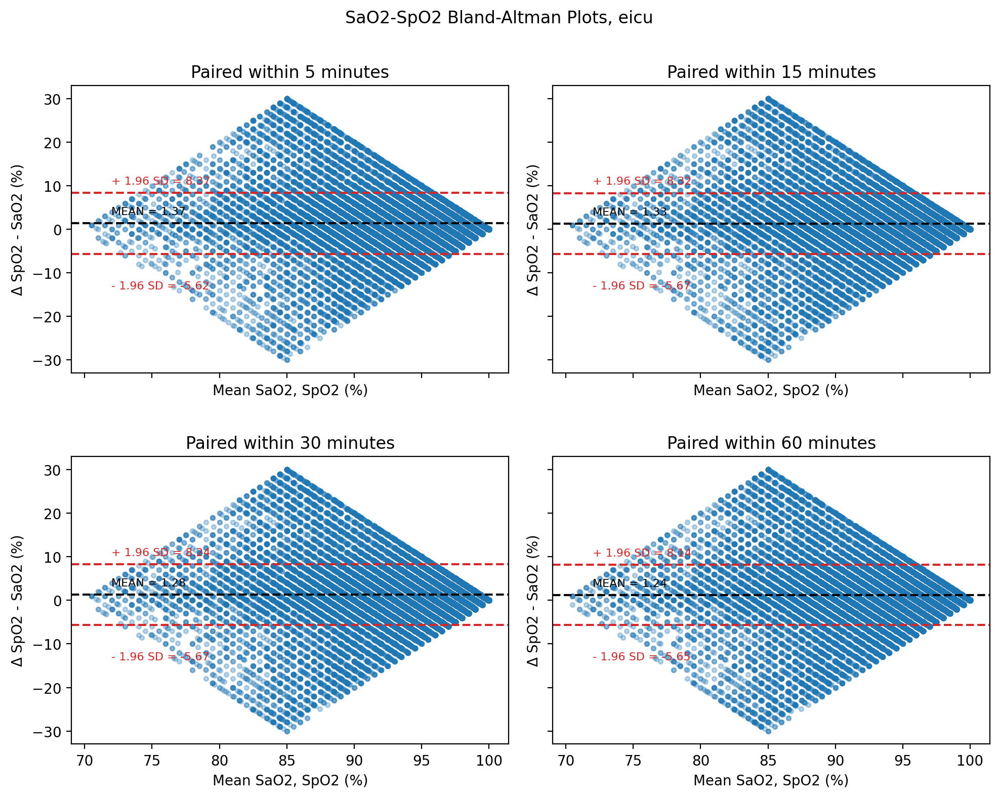

In [98]:
fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharex=True, sharey=True)

deltas_up = [-5, -15, -30, -60]

for d_u, ax in zip(deltas_up, axs.flatten()):
    plt.sca(ax)
    data_subset = df_cut[(df_cut['delta_SpO2'] <= 0) & (df_cut['delta_SpO2'] >= d_u)]
    bland_altman_plot(data_subset['SpO2'], data_subset['SaO2'])
    plt.title(f'\nPaired within {-d_u} minutes') ## typical math (0, 5) min

plt.suptitle(f"SaO2-SpO2 Bland-Altman Plots, {db}")
plt.tight_layout()
plt.show()
print('\n')

#### by db

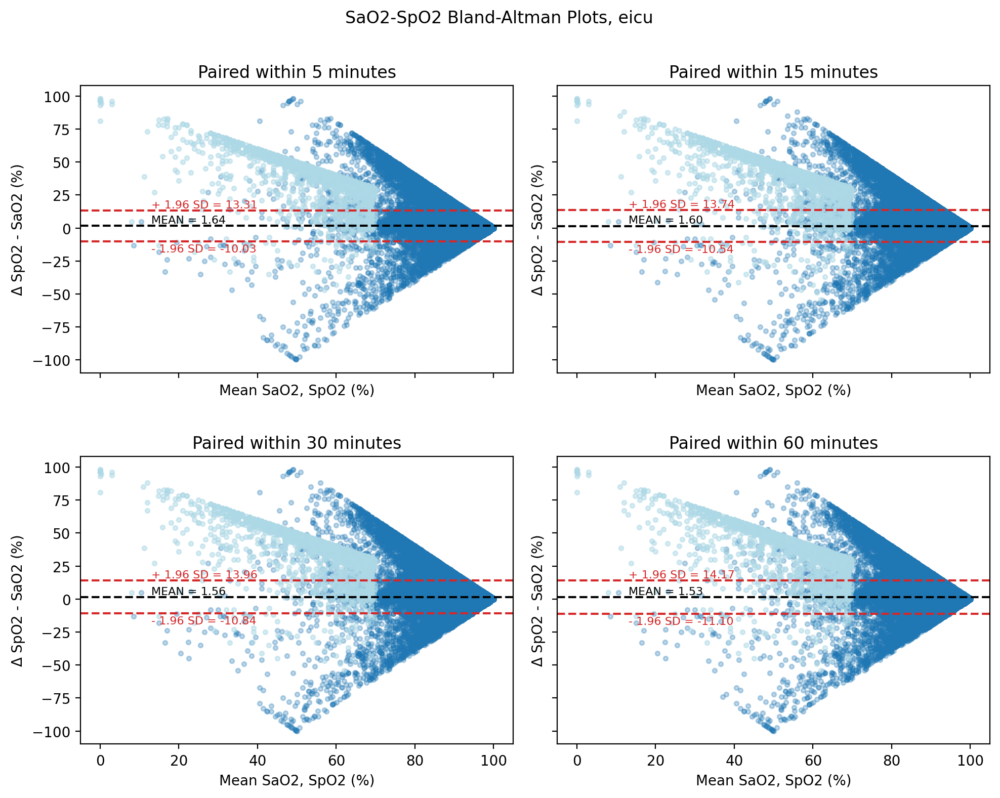

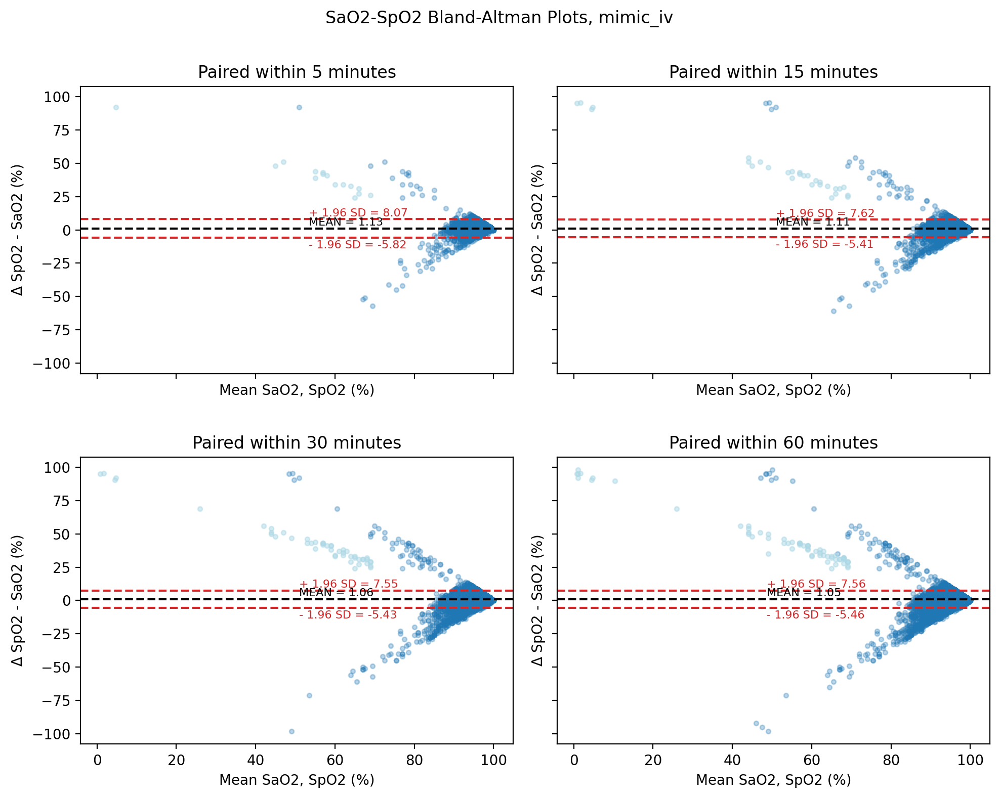

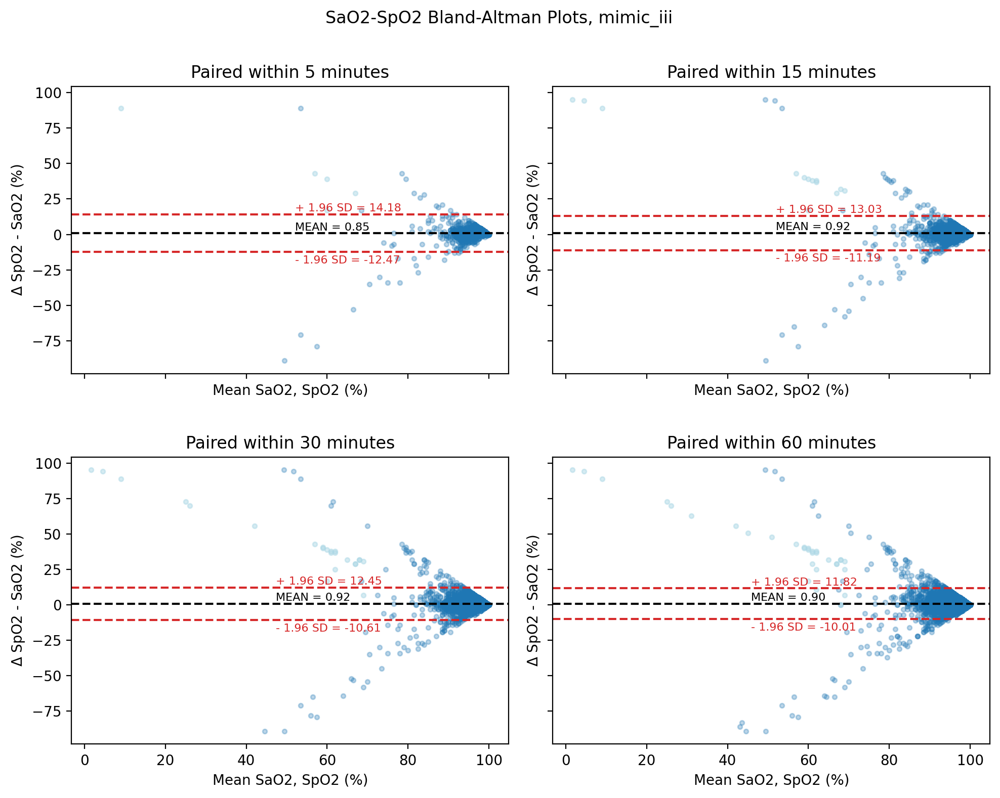

In [99]:
dbs = ["eicu", "mimic_iv", "mimic_iii"]

for db in dbs:

  df_db = df[df.source_db == db]

  fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharex=True, sharey=True)

  deltas_up = [-5, -15, -30, -60]

  for d_u, ax in zip(deltas_up, axs.flatten()):
      plt.sca(ax)
      data_subset = df_db[(df_db['delta_SpO2'] <= 0) & (df_db['delta_SpO2'] >= d_u)]
      bland_altman_plot(data_subset['SpO2'], data_subset['SaO2'])
      plt.title(f'\nPaired within {-d_u} minutes') ## typical math (0, 5) min

  plt.suptitle(f"SaO2-SpO2 Bland-Altman Plots, {db}")
  plt.tight_layout()
  plt.show()
  print('\n')

### by race-ethnicity

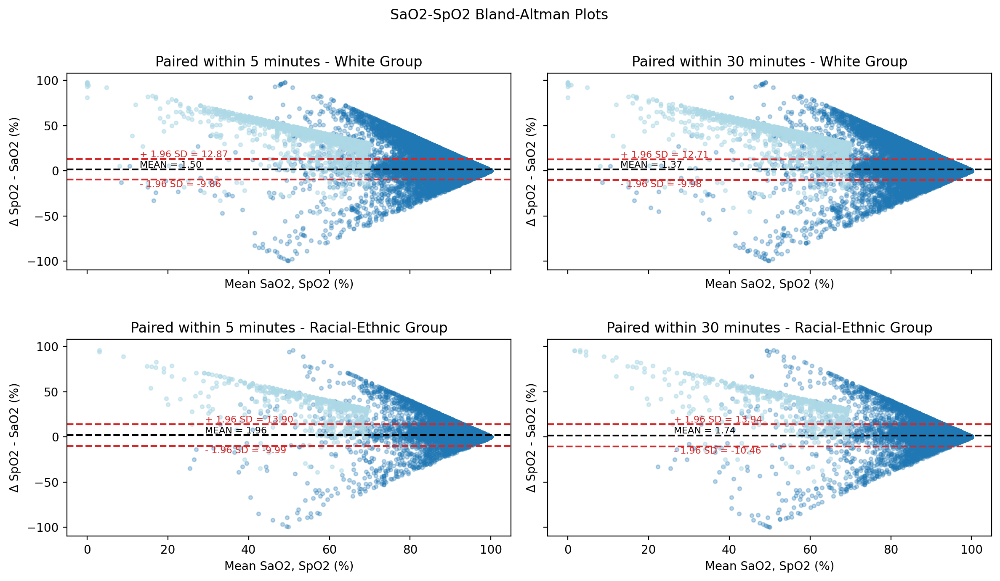

In [100]:
df['race_white'] = df['race_ethnicity'].apply(lambda x: 'White Group' if x == 'White' else 'Racial-Ethnic Group')
race_bin = ['White Group', 'Racial-Ethnic Group']

fig, axs = plt.subplots(2, 2, figsize=(12, 7), sharex=True, sharey=True)

for i, r in enumerate(race_bin):
    df_res = df[df.race_white == r]

    deltas_up = [-5, -30]

    for d_u, ax in zip(deltas_up, axs[i]):
        plt.sca(ax)
        data_subset = df_res[(df_res['delta_SpO2'] <= 0) & (df_res['delta_SpO2'] >= d_u)]
        bland_altman_plot(data_subset['SpO2'], data_subset['SaO2'])
        plt.title(f'\nPaired within {-d_u} minutes - {r}')

plt.suptitle('SaO2-SpO2 Bland-Altman Plots')
plt.tight_layout()
plt.show()

### modified

In [101]:
def bland_altman_plot(data1, data2, *args, **kwargs):
  data1     = np.asarray(data1)
  data2     = np.asarray(data2)
  mean      = np.mean([data1, data2], axis=0)
  diff      = data1 - data2
  md        = np.mean(diff)
  sd        = np.std(diff, axis=0)
  se        = sd / np.sqrt(len(diff))
  up_ci     = md + 1.96 * sd
  lo_ci     = md - 1.96 * sd

  plt.scatter(data2, diff, alpha=0.5, s=10, color='tab:blue', label='Data')

  # Create a mask for values below 70% SaO2
  mask = data2 < 70
  plt.scatter(data2[mask], diff[mask], alpha=0.5, s=10, color='lightblue', label='SaO2 < 70%')

  plt.axhline(md, color='black', linestyle='--')
  plt.axhline(up_ci, color='tab:red', linestyle='--')
  plt.axhline(lo_ci, color='tab:red', linestyle='--')

  x_text = np.min(mean) + 0.05 * (np.max(mean) - np.min(mean))  # Dynamic x-coordinate

  plt.text(x_text, md + 2, f'MEAN = {md:.2f}',
            color='black', fontsize=8, fontweight='bold')
  plt.text(x_text, (up_ci) + 2, f'+ 1.96 SD = {up_ci:.2f}',
            color='tab:red' ,fontsize=8)
  plt.text(x_text, (lo_ci) - 8, f'- 1.96 SD = {lo_ci:.2f}',
            color='tab:red', fontsize=8)
  plt.xlabel('SaO2 (%)')
  plt.ylabel('$\Delta$ SpO2 - SaO2 (%)')

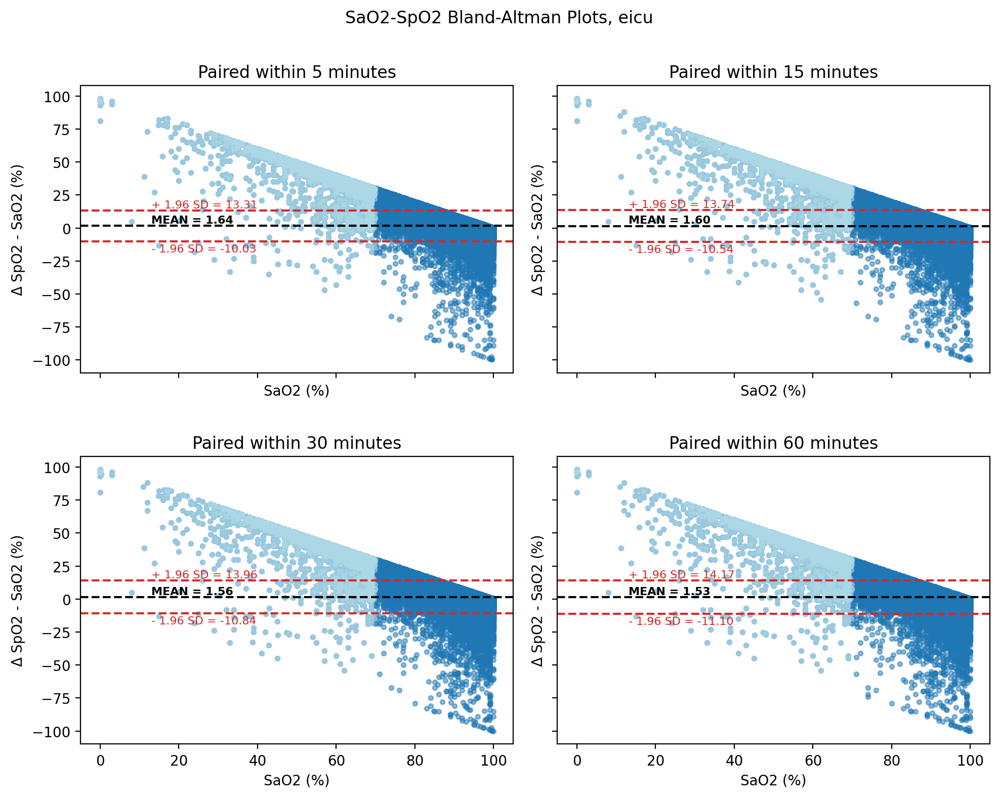

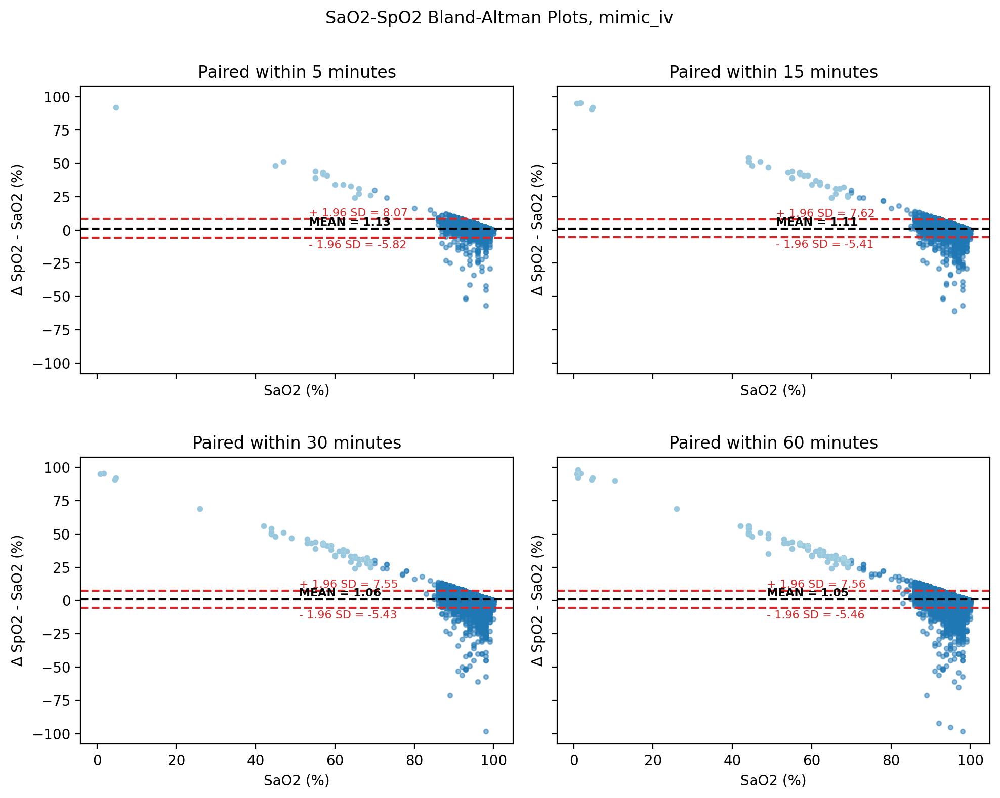

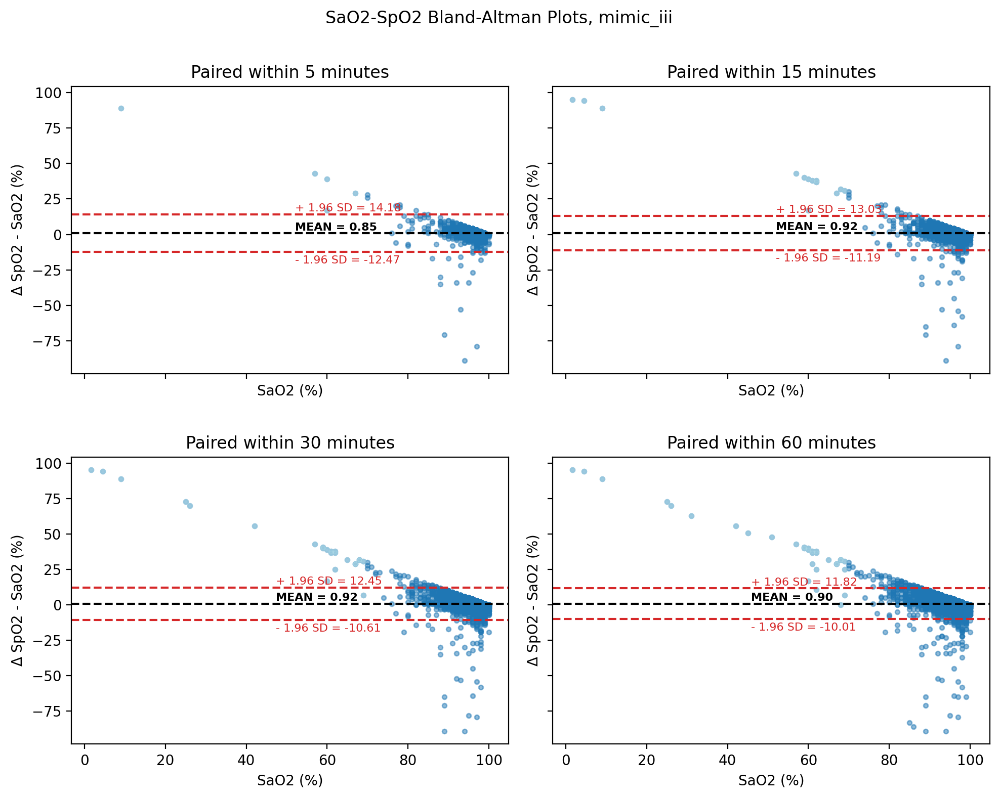

In [102]:
dbs = ["eicu", "mimic_iv", "mimic_iii"]

for db in dbs:

  df_db = df[df.source_db == db]

  fig, axs = plt.subplots(2, 2, figsize=(10, 8), sharex=True, sharey=True)

  deltas_up = [-5, -15, -30, -60]

  for d_u, ax in zip(deltas_up, axs.flatten()):
      plt.sca(ax)
      data_subset = df_db[(df_db['delta_SpO2'] <= 0) & (df_db['delta_SpO2'] >= d_u)]
      bland_altman_plot(data_subset['SpO2'], data_subset['SaO2'])
      plt.title(f'\nPaired within {-d_u} minutes')

  plt.suptitle(f"SaO2-SpO2 Bland-Altman Plots, {db}")
  plt.tight_layout()
  plt.show()
  print('\n')

#### 2 time windows, 2 race-ethnicity groups

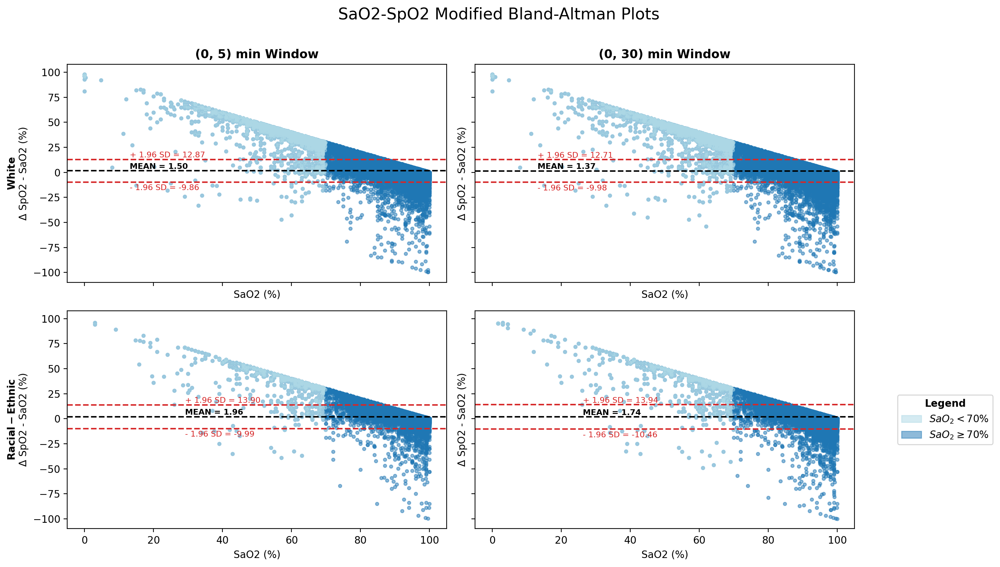

In [103]:
df['race_white'] = df['race_ethnicity'].apply(lambda x: 'White Group' if x == 'White' else 'Racial-Ethnic Group')
race_bin = ['White Group', 'Racial-Ethnic Group']

fig, axs = plt.subplots(2, 2, figsize=(14, 8), sharex=True, sharey=True)

# Define the header titles for the columns and rows
column_headers = ["(0, 5) min Window",
                  "(0, 30) min Window"]
row_headers = ["White", "Racial-Ethnic"]

for i, r in enumerate(race_bin):
    df_res = df[df.race_white == r]
    deltas_up = [-5, -30]

    for j, (d_u, ax) in enumerate(zip(deltas_up, axs[i])):
        plt.sca(ax)
        data_subset = df_res[(df_res['delta_SpO2'] <= 0) & (df_res['delta_SpO2'] >= d_u)]
        bland_altman_plot(data_subset['SpO2'], data_subset['SaO2'])

        # Setting the headers for the top-most row
        if i == 0:
            ax.set_title(column_headers[j], fontweight='bold')
        # Setting the headers for the left-most column
        if j == 0:
            ax.set_ylabel(r"$\bf{" + row_headers[i] + "}$\nΔ SpO2 - SaO2 (%)")
        else:
            ax.set_ylabel("Δ SpO2 - SaO2 (%)")

blue_below_70 = mpatches.Patch(color='lightblue', alpha=0.5, label='$SaO_{2} < 70\%$')
blue_above_70 = mpatches.Patch(color='tab:blue', alpha=0.5, label='$SaO_{2} \geq 70\%$')

plt.legend(handles=[blue_below_70, blue_above_70],
           loc='center left', bbox_to_anchor=(1.1, 0.5), title='Legend')\
           .get_title().set_weight('bold')

plt.suptitle('SaO2-SpO2 Modified Bland-Altman Plots\n', fontsize=16)
plt.tight_layout()
plt.show()

## calibration map

In [104]:
import pandas as pd
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error
from matplotlib.gridspec import GridSpec
from matplotlib import pyplot as plt
import seaborn as sns


def sao2_spo2_plot(df, SaO2_HH=88, SpO2_HH=88,
                   lbl_text="Measured"):

    r2 = r2_score(df.SaO2, df.SpO2)

    fig = plt.figure(figsize=(8,8))
    gs = GridSpec(5,5)

    ax_scatter = fig.add_subplot(gs[1:5, 0:4])

    df_norm = df[~((df.SaO2 < SaO2_HH) & (df.SpO2 >= SpO2_HH))]
    df_hypo = df[(df.SaO2 < SaO2_HH) & (df.SpO2 >= SpO2_HH)]

    hh = len(df_hypo)
    tot = len(df_norm) + len(df_hypo)

    sns.scatterplot(df_norm, x='SpO2', y='SaO2',
                    marker='o', alpha=0.1, ax=ax_scatter)
    sns.scatterplot(df_hypo, x='SpO2', y='SaO2',
                    marker='o', color="tab:red", alpha=0.1, ax=ax_scatter,
                    label="H.H")
    ax_scatter.set_xlabel(f'{lbl_text} SpO2 (%)')
    ax_scatter.set_ylabel('SaO2 (%)')
    ax_scatter.set_xlim([69, 102])
    ax_scatter.set_ylim([69, 102])
    ax_scatter.grid(False)
    ax_scatter.get_legend().remove()

    ax_hist_x = fig.add_subplot(gs[0,0:4])
    sns.kdeplot(x=df.SpO2, ax=ax_hist_x, color='green', fill=True)
    ax_hist_x.xaxis.set_ticklabels([])
    ax_hist_x.grid(False)
    ax_hist_x.set_xlabel('')
    ax_hist_x.set_ylim([0,.35])
    ax_hist_x.axvline(x=df.SpO2.mean(), linewidth=0.8,
                    linestyle='--', color='green',
                    label="SpO2 Mean")


    ax_hist_y = fig.add_subplot(gs[1:5, 4])
    sns.kdeplot(y=df.SaO2, ax=ax_hist_y, color='orange', fill=True)
    ax_hist_y.yaxis.set_ticklabels([])
    ax_hist_y.grid(False)
    ax_hist_y.set_ylabel('')
    ax_hist_y.set_xlim([0,.35])
    ax_hist_y.axhline(y=df.SaO2.mean(), xmin=0, xmax=1,
                    linewidth=0.8, linestyle='--', color='orange',
                    label="SaO2 Mean")

    fig.legend(loc='upper right', bbox_to_anchor=(0.915, 0.85),
               ncol=1, fontsize=9)

    fig.suptitle(f"SaO2 vs SpO2: R\u00B2 = {r2:.2f}, H.H = {hh} / {tot}",
                 fontsize=16, y=0.95)

    plt.show()


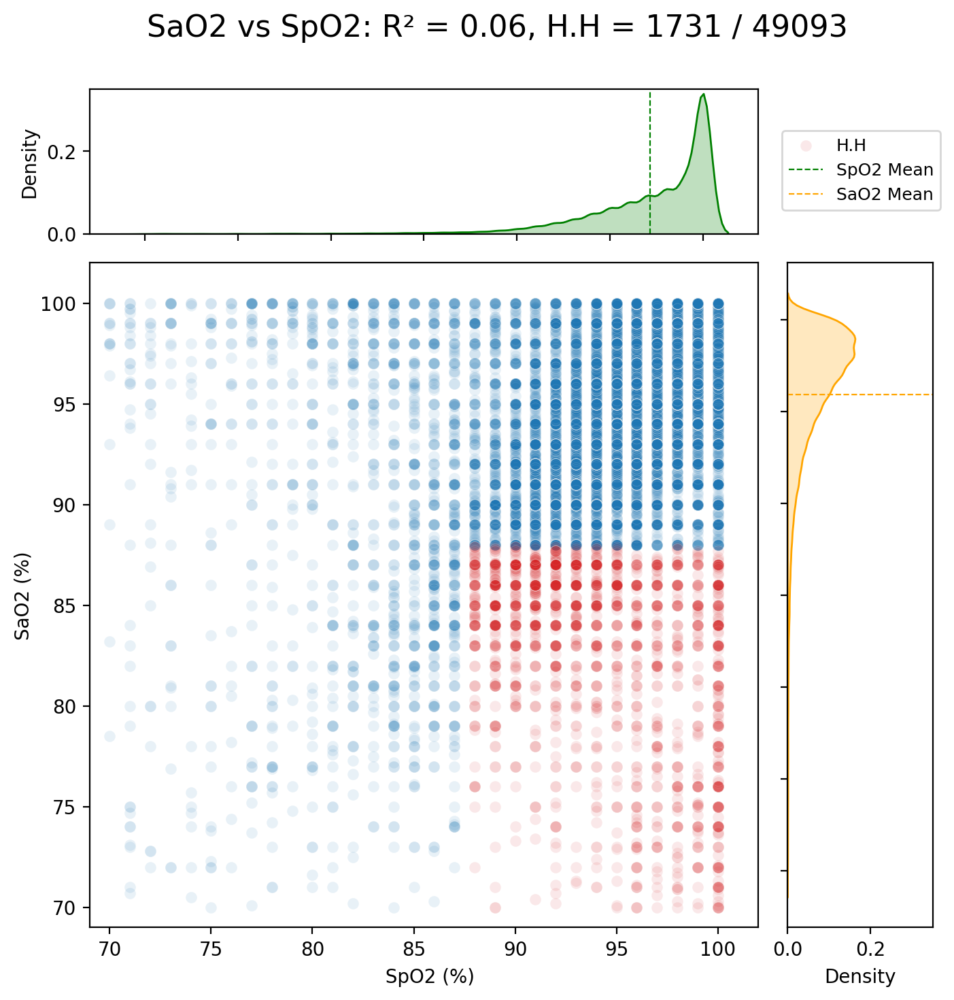

In [105]:
sao2_spo2_plot(df_clean, SaO2_HH=88, SpO2_HH=88, lbl_text=" ")

## delta and no. samples

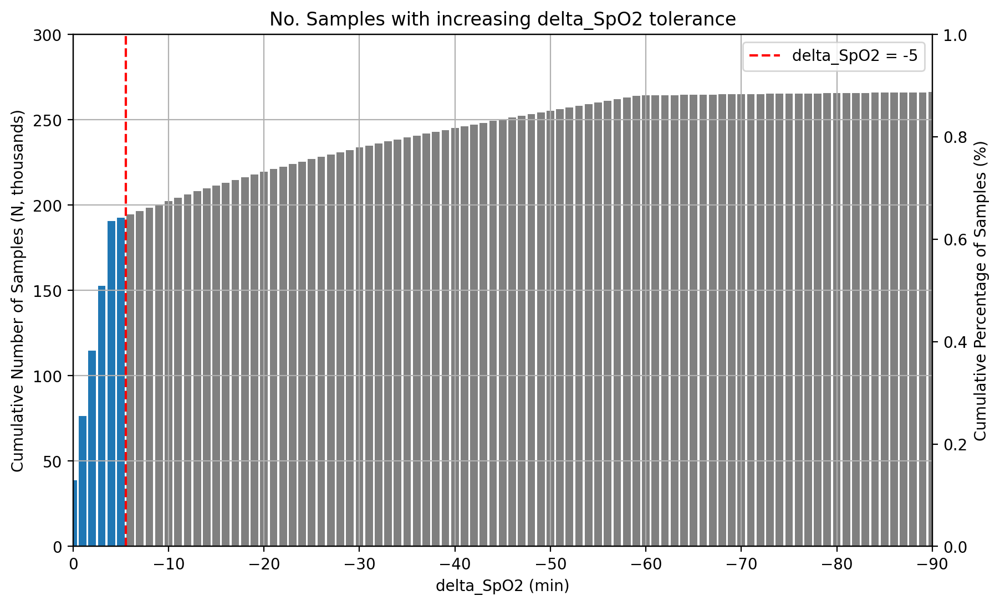

In [106]:
count_df = df.groupby('delta_SpO2').size().reset_index(name='counts')
count_df = count_df.sort_values(by='delta_SpO2', ascending=False)
count_df['cumulative_counts'] = count_df['counts'].cumsum()/1000
count_df['cumulative_percentage'] = 100 * count_df['cumulative_counts'] / count_df['counts'].sum()

fig, ax1 = plt.subplots(figsize=(10, 6))

colors = ['gray' if x < -5 else 'tab:blue' for x in count_df['delta_SpO2']]

ax1.bar(count_df['delta_SpO2'], count_df['cumulative_counts'], color=colors)
ax1.axvline(x=-5.5, color='red', linestyle='--', label='delta_SpO2 = -5')
ax1.set_xlabel('delta_SpO2 (min)')
ax1.set_ylabel('Cumulative Number of Samples (N, thousands)')
ax1.set_ylim([0, 300000/1000])
ax1.set_xlim([0, -90])  # To reverse the x-axis
ax1.grid(True)
ax1.legend()
ax1.tick_params(axis='y')

# Create the second y-axis for the relative number of samples (%)
ax2 = ax1.twinx()
ax2.set_ylabel('Cumulative Percentage of Samples (%)')
ax2.tick_params(axis='y')
plt.title("No. Samples with increasing delta_SpO2 tolerance")

plt.show()


## ARMS

pulse oximeters usually report the average root mean squared (ARMS) as a value to report their accuracy:

[check this link](https://openoximetry.org/oximeters/?sort=manufacturer-asc&display=24&view=tile&columns=producer,status,performance&oximeter_type=fingertip)

In [107]:
def arms(df):
  df['difference'] = df['SpO2'] - df['SaO2']

  df['squared_difference'] = df['difference'] ** 2

  return (df['squared_difference'].mean()) ** 0.5

In [108]:
import numpy as np

def arms_with_ci(df):
  # Calculate the difference
  df['difference'] = df['SpO2'] - df['SaO2']
  df['squared_difference'] = df['difference'] ** 2

  # Calculate RMS
  rms = (df['squared_difference'].mean()) ** 0.5

  # Calculate STD of the difference
  std = df['difference'].std()

  # Calculate SE from STD
  se = std / np.sqrt(len(df))

  # Calculate the 95% confidence interval for RMS
  ci_lower = rms - 1.96 * se
  ci_upper = rms + 1.96 * se

  return rms, ci_lower, ci_upper


### overall numbers

#### big dataset

In [109]:
print(f"Big Dataset: {arms(df):.2f} %")

Big Dataset: 6.02 %


In [110]:
arms_with_ci(df)

(6.018625309100773, 5.996368416043004, 6.040882202158541)

#### clean dataset

In [111]:
print(f"Our clean Dataset: {arms(df_clean):.2f} %")

Our clean Dataset: 4.05 %


In [112]:
arms_with_ci(df_clean)

(4.048821094329247, 4.014667761242942, 4.082974427415552)

### over delta_spo2

In [113]:
import matplotlib.pyplot as plt

def plot_arms(df, race_ethnicity=None):
    # Define a new DataFrame to store the ARMS values and confidence intervals
    arms_df = pd.DataFrame(columns=['delta_SpO2', 'arms_value', 'ci_lower', 'ci_upper'])

    # Loop through unique delta_SpO2 values in descending order
    for value in sorted(df['delta_SpO2'].unique(), reverse=True):
        # Create a subset of the original DataFrame with delta_SpO2 up to the current value
        subset_df = df[df['delta_SpO2'] <= value]
        arms_value, ci_lower, ci_upper = arms_with_ci(subset_df)
        arms_df.loc[len(arms_df)] = [value, arms_value, ci_lower, ci_upper]

    fig, ax = plt.subplots(figsize=(10, 6))

    # Plotting the ARMS values
    ax.plot(arms_df['delta_SpO2'], arms_df['arms_value'], color='black', label='ARMS')

    # Shading the area between the confidence intervals
    ax.fill_between(arms_df['delta_SpO2'], arms_df['ci_lower'], arms_df['ci_upper'],
                    color='gray', alpha=0.1, label='95% CI')

    ax.set_ylabel('ARMS (%)')
    ax.set_xlim([0, -90])  # To reverse the x-axis
    ax.set_xlabel('delta_SpO2 (min)')
    ax.axvline(x=-5.5, color='red', linestyle='--', label='delta_SpO2 = -5')
    ax.grid(True)
    plt.legend()

    # Set title depending on the race_ethnicity
    title = "ARMS with increasing delta_SpO2 tolerance"
    if race_ethnicity:
        title += f" for {race_ethnicity}"

    plt.title(title)
    plt.show()


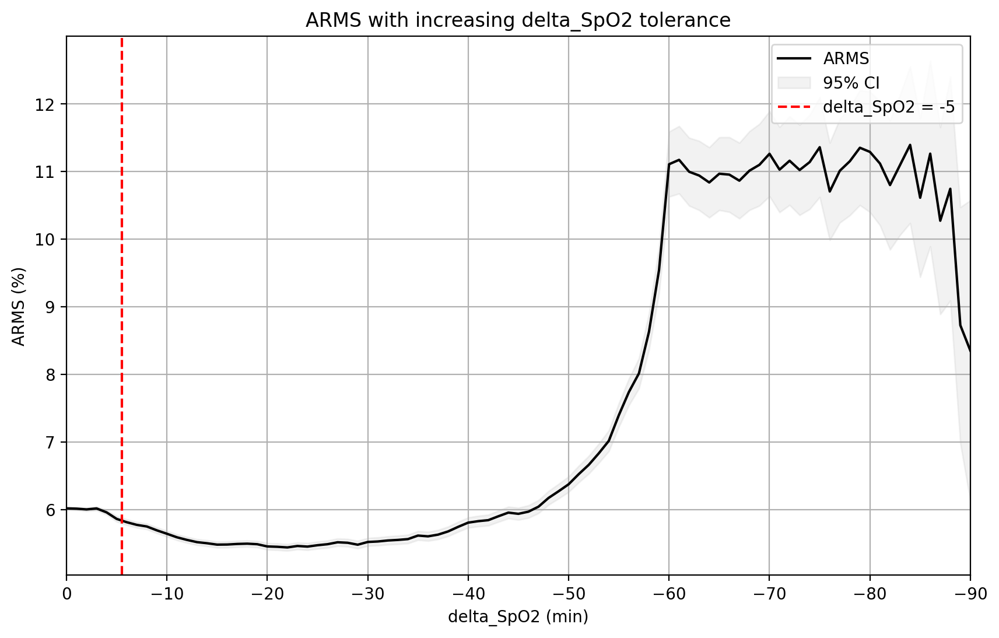

In [114]:
plot_arms(df)

### by race_ethincity

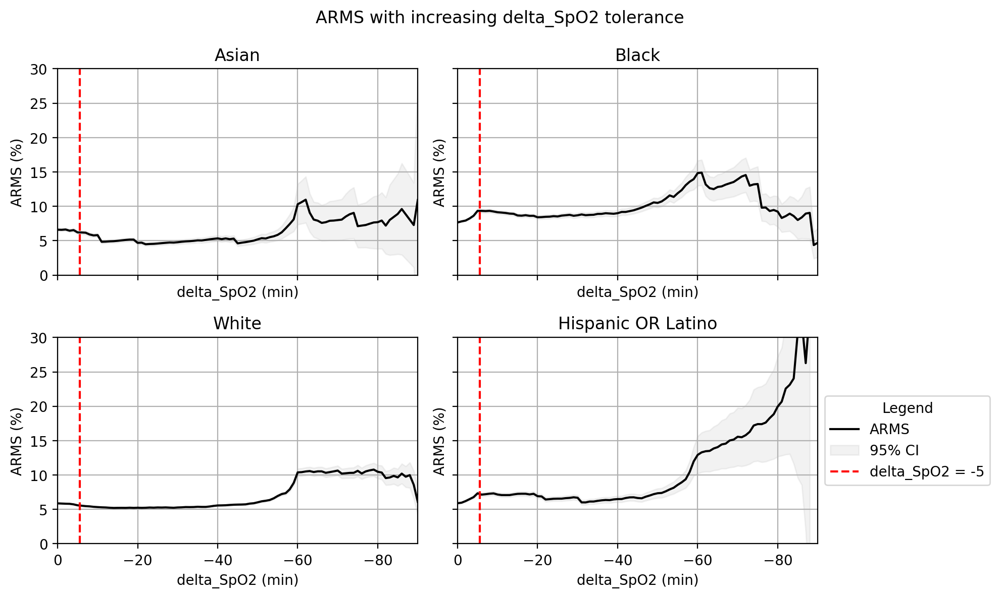

In [115]:
def plot_arms_subplots(df, race_ethnicity_values):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 6),
                             sharex=True, sharey=True)
    axes = axes.flatten()

    for i, race in enumerate(race_ethnicity_values):
        subset_df = df[df['race_ethnicity'] == race]
        arms_df = pd.DataFrame(columns=['delta_SpO2', 'arms_value', 'ci_lower', 'ci_upper'])

        # Loop through unique delta_SpO2 values in descending order
        for value in sorted(subset_df['delta_SpO2'].unique(), reverse=True):
            subset = subset_df[subset_df['delta_SpO2'] <= value]
            arms_value, ci_lower, ci_upper = arms_with_ci(subset)
            arms_df.loc[len(arms_df)] = [value, arms_value, ci_lower, ci_upper]

        ax = axes[i]

        # Plotting the ARMS values
        ax.plot(arms_df['delta_SpO2'], arms_df['arms_value'], color='black', label='ARMS')

        # Shading the area between the confidence intervals
        ax.fill_between(arms_df['delta_SpO2'], arms_df['ci_lower'], arms_df['ci_upper'],
                        color='gray', alpha=0.1, label='95% CI')

        ax.set_ylabel('ARMS (%)')
        ax.set_xlim([0, -90])  # To reverse the x-axis
        ax.set_ylim([0, 30])
        ax.set_xlabel('delta_SpO2 (min)')
        ax.axvline(x=-5.5, color='red', linestyle='--', label='delta_SpO2 = -5')
        ax.grid(True)


        # Set title depending on the race_ethnicity
        title = f"{race}"
        ax.set_title(title)

    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), title='Legend')
    plt.suptitle("ARMS with increasing delta_SpO2 tolerance")
    plt.tight_layout()
    plt.show()

res = ['Asian', 'Black', 'White', 'Hispanic OR Latino']
plot_arms_subplots(df, res)


### overlaying the histogram

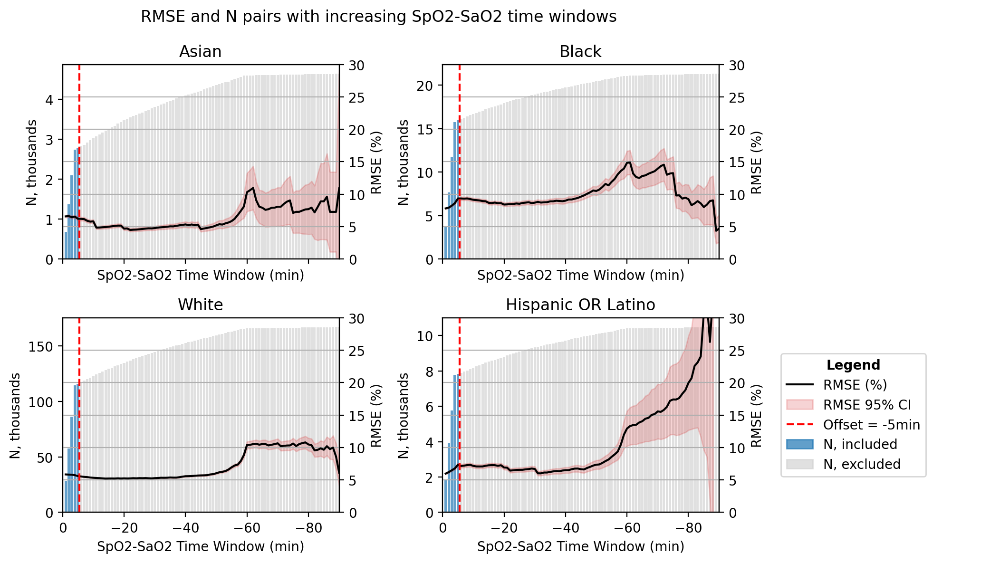

In [116]:
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

def plot_arms_subplots(df, race_ethnicity_values):
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 6),
                             sharex=True)
    axes = axes.flatten()

    delta_spo2s = list(range(-90,0))

    for i, race in enumerate(race_ethnicity_values):
        subset_df = df[df['race_ethnicity'] == race]
        arms_df = pd.DataFrame(columns=['delta_SpO2', 'arms_value', 'ci_lower', 'ci_upper'])

        # Loop through unique delta_SpO2 values in descending order
        for value in delta_spo2s:
            subset = subset_df[subset_df['delta_SpO2'] <= value]
            arms_value, ci_lower, ci_upper = arms_with_ci(subset)
            arms_df.loc[len(arms_df)] = [value, arms_value, ci_lower, ci_upper]

        ax2 = axes[i]



        # Create a twin axes for the histogram with counts
        ax = ax2.twinx()

        all_delta_spo2s = pd.DataFrame({'delta_SpO2': delta_spo2s})
        count_df = subset_df.groupby('delta_SpO2').size().reset_index(name='counts')
        count_df = pd.merge(all_delta_spo2s, count_df, on='delta_SpO2', how='left').fillna(0)
        count_df = count_df.sort_values(by='delta_SpO2', ascending=False)
        count_df['cumulative_counts'] = count_df['counts'].cumsum()/1000

        colors = ['lightgray' if x < -5 else 'tab:blue' for x in count_df['delta_SpO2']]
        ax2.bar(count_df['delta_SpO2'], count_df['cumulative_counts'],
                color=colors, alpha=.7)

        ax2.set_ylabel('N, thousands')
        ax2.tick_params(axis='y')

        # Plotting the ARMS values
        ax.plot(arms_df['delta_SpO2'], arms_df['arms_value'], color='black')
        ax.fill_between(arms_df['delta_SpO2'], arms_df['ci_lower'], arms_df['ci_upper'],
                        color='tab:red', alpha=0.2)

        ax.axvline(x=-5.5, color='red', linestyle='--')
        ax.set_ylabel('RMSE (%)')
        ax.set_xlim([0, -90])  # To reverse the x-axis
        ax.set_ylim([0, 30])
        ax.grid(True)
        ax2.set_xlabel('SpO2-SaO2 Time Window (min)')

        title = f"{race}"
        ax.set_title(title)

    # Custom legend
    arms_line = mlines.Line2D([], [], color='black', label='RMSE (%)')
    ci_patch = mpatches.Patch(color='tab:red', alpha=0.2, label='RMSE 95% CI')
    delta_line = mlines.Line2D([], [], color='red', linestyle='--', label='Offset = -5min')
    blue_bar = mpatches.Patch(color='tab:blue', alpha=0.7, label='N, included')
    gray_bar = mpatches.Patch(color='lightgray', alpha=0.7, label='N, excluded')

    plt.legend(handles=[arms_line, ci_patch, delta_line, blue_bar, gray_bar],
               loc='center left', bbox_to_anchor=(1.2, 0.5), title='Legend')\
               .get_title().set_weight('bold')

    plt.suptitle("RMSE and N pairs with increasing SpO2-SaO2 time windows                                                                          ")
    plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjusting layout to fit legend
    plt.show()

# Usage
res = ['Asian', 'Black', 'White', 'Hispanic OR Latino']
plot_arms_subplots(df, res)


## delta_spo2 per race_ethnicity

### clean df

In [117]:
from scipy import stats

def mean_confidence_interval(data, confidence=0.95):
    n = len(data)
    mean, se = np.mean(data), stats.sem(data)
    std = np.std(data)
    h = se * 1.96  # Using 1.96 as the z-value for a 95% CI with a normal distribution
    return abs(round(mean, 3)), std, abs(round(mean - h, 3)), abs(round(mean + h, 3)), n

def get_deltas(df):

  counts = df.groupby('race_ethnicity')['delta_SpO2'].count().reset_index()
  counts.rename(columns={'delta_SpO2': 'N'}, inplace=True)
  results = df.groupby('race_ethnicity')['delta_SpO2'].apply(mean_confidence_interval).reset_index()
  results = pd.merge(results, counts, on='race_ethnicity')
  results[['mean','std', '2.5%', '97.5%', 'N']] = pd.DataFrame(results['delta_SpO2'].tolist(), index=results.index)
  results.drop(columns=['delta_SpO2'], inplace=True)

  results = results[(results.race_ethnicity != "Native Hawaiian / Pacific Islander") \
                  & (results.race_ethnicity != "More Than One Race")].reset_index()

  return results

results_clean = get_deltas(df_clean)

results_clean

,index,race_ethnicity,N,mean,std,2.5%,97.5%
0,0,American Indian / Alaska Native,380,2.034,1.407270,2.176,1.893
1,1,Asian,858,2.023,1.473754,2.122,1.925
2,2,Black,4785,2.048,1.462870,2.090,2.007
3,3,Hispanic OR Latino,2116,2.010,1.458109,2.072,1.948
4,6,Unknown,3562,2.092,1.539177,2.143,2.042
5,7,White,37380,2.031,1.463393,2.046,2.016


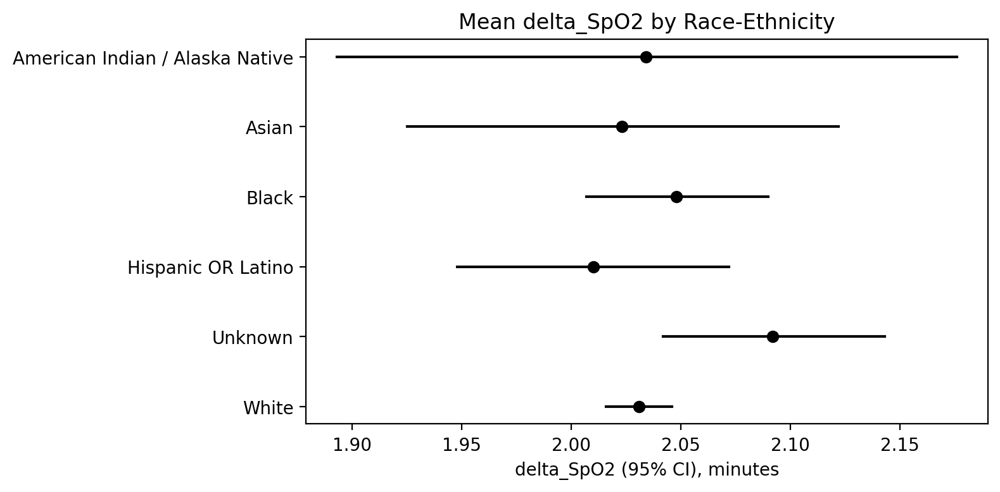

In [118]:
def plot_deltas(results):

  plt.figure(figsize=(8, len(results)-2))

  # Plotting the means and confidence intervals for each group
  for idx, row in results.iterrows():
      plt.plot([row['2.5%'], row['97.5%']], [idx, idx], color='black')
      plt.plot(row['mean'], idx, 'o', color='black')

  plt.yticks(range(len(results)), results['race_ethnicity']) # Setting the y-tick labels
  plt.xlabel('delta_SpO2 (95% CI), minutes')
  plt.title('Mean delta_SpO2 by Race-Ethnicity')
  plt.gca().invert_yaxis() # To display the first entry at the top
  plt.tight_layout()
  plt.show()

plot_deltas(results_clean)


### big df

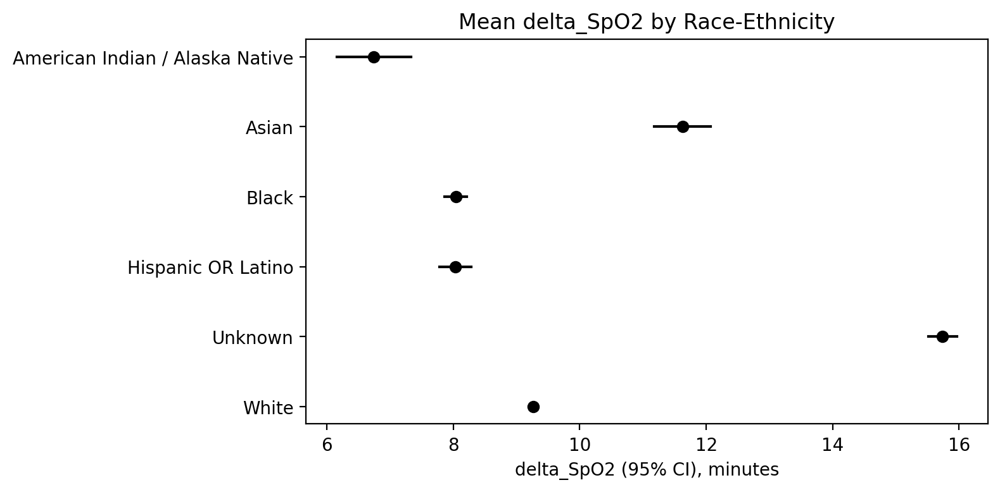

In [119]:
results_big = get_deltas(df)
plot_deltas(results_big)

#### side by side

## no. pairs per race_ethnicity

### clean df
would be 1 across the board, thus skip

### big df

In [120]:
# Count pairs per hadm_id
pairs_per_hadm_id = df.groupby('hospital_admission_id').size().reset_index(name='pairs')

# Merge with race/ethnicity information
pairs_with_race = pd.merge(pairs_per_hadm_id, df[['hospital_admission_id', 'race_ethnicity']]\
                           .drop_duplicates(), on='hospital_admission_id')

# Function to compute mean, confidence intervals, and number of pairs
def compute_stats(data):
    mean, std, ci_lower, ci_upper, n = mean_confidence_interval(data['pairs'])
    return pd.Series({'mean': mean, 'std': std, '2.5%': ci_lower, '97.5%': ci_upper, 'N': n})

# Group by race_ethnicity and apply the compute_stats function
results = pairs_with_race.groupby('race_ethnicity').apply(compute_stats).reset_index()

# Optional: Filter results (e.g., remove groups with fewer than 50 pairs)
results = results.loc[results.N >= 50].reset_index()

results

,index,race_ethnicity,mean,std,2.5%,97.5%,N
0,0,American Indian / Alaska Native,4.710,8.492357,3.874,5.547,397.0
1,1,Asian,5.118,10.881777,4.463,5.773,1061.0
2,2,Black,4.648,8.227227,4.430,4.867,5467.0
3,3,Hispanic OR Latino,5.086,8.654257,4.742,5.430,2436.0
4,6,Unknown,4.956,9.468385,4.694,5.217,5030.0
5,7,White,4.466,7.739173,4.393,4.538,43925.0


In [121]:
results_docs = results[['race_ethnicity', 'mean', 'std', 'N']].round(2)

# Convert the subset dataframe to string format
table_string = results_docs.to_string(index=False)

print(table_string)


                 race_ethnicity  mean   std       N
American Indian / Alaska Native  4.71  8.49   397.0
                          Asian  5.12 10.88  1061.0
                          Black  4.65  8.23  5467.0
             Hispanic OR Latino  5.09  8.65  2436.0
                        Unknown  4.96  9.47  5030.0
                          White  4.47  7.74 43925.0


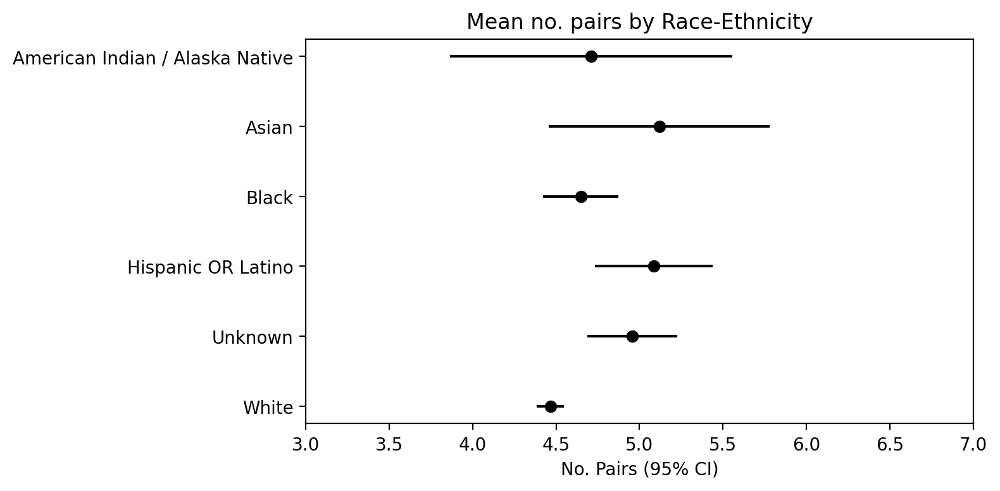

In [122]:
plt.figure(figsize=(8, len(results)-2))

# Plotting the means and confidence intervals for each group
for idx, row in results.iterrows():
    plt.plot([row['2.5%'], row['97.5%']], [idx, idx], color='black')
    plt.plot(row['mean'], idx, 'o', color='black')

plt.yticks(range(len(results)), results['race_ethnicity']) # Setting the y-tick labels
plt.xlim([3,7])
plt.xlabel('No. Pairs (95% CI)')
plt.title('Mean no. pairs by Race-Ethnicity')
plt.gca().invert_yaxis() # To display the first entry at the top
plt.tight_layout()
plt.show()
